[*********************100%***********************]  1 of 1 completed


Epoch 1/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 11.6680
Epoch 2/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 7.5774
Epoch 3/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.6152
Epoch 4/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 7.5362
Epoch 5/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 7.3780
Epoch 6/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.4654
Epoch 7/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.4412
Epoch 8/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.4856
Epoch 9/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.3967
Epoch 10/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 7.4568
Epoch 11/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 7.4347
Epoch 12/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.4256
Epoch 13/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.4687
Epoch 14/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.4889
Epoch 15/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - l

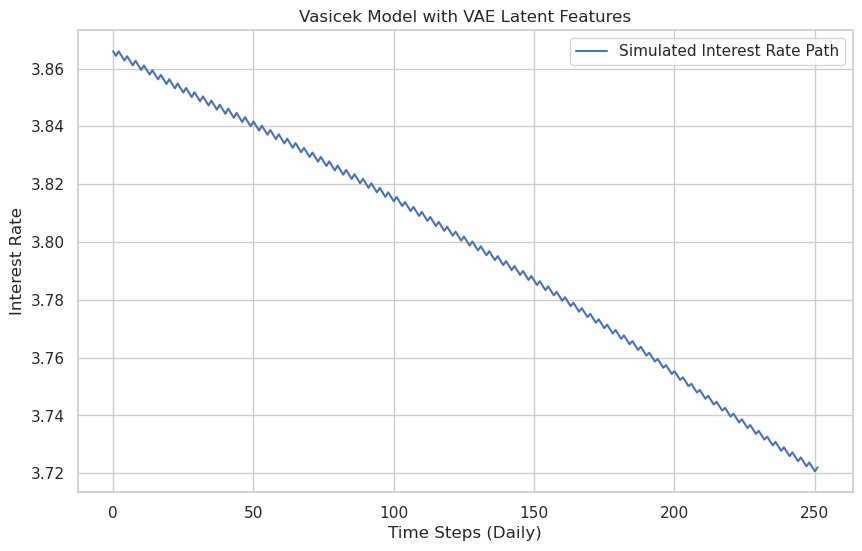

In [40]:
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler

# Step 1: Fetch data
ticker = '^TNX'  # U.S. 10-year Treasury yield (interest rates)
data = yf.download(ticker, start='2000-01-01', end='2024-01-01')  # Extended data range
interest_rates = data['Adj Close']

# Normalize the interest rates
scaler = StandardScaler()
interest_rates_normalized = scaler.fit_transform(interest_rates.values.reshape(-1, 1))

# Step 2: Build the VAE model
latent_dim = 3  # Latent dimension
inputs = layers.Input(shape=(1,))
x = layers.Dense(128, activation='relu')(inputs)
x = layers.Dense(64, activation='relu')(x)
x = layers.Dense(32, activation='relu')(x)
z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)

class Sampling(layers.Layer):
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = K.shape(z_mean)[0]
        dim = K.int_shape(z_mean)[1]
        epsilon = K.random_normal(shape=(batch, dim))
        return z_mean + K.exp(0.5 * z_log_var) * epsilon

z = Sampling()([z_mean, z_log_var])
latent_inputs = layers.Input(shape=(latent_dim,))
x = layers.Dense(64, activation='relu')(latent_inputs)
x = layers.Dense(128, activation='relu')(x)
outputs = layers.Dense(1)(x)

encoder = models.Model(inputs, [z_mean, z_log_var, z])
decoder = models.Model(latent_inputs, outputs)
vae_output = decoder(encoder(inputs)[2])

def vae_loss(inputs, vae_output, z_mean, z_log_var):
    xent_loss = K.mean(K.square(inputs - vae_output), axis=-1)
    kl_loss = -0.5 * K.mean(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
    return xent_loss + kl_loss

class VAEWithLoss(models.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAEWithLoss, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def call(self, inputs):
        z_mean, z_log_var, z = self.encoder(inputs)
        vae_output = self.decoder(z)
        loss = vae_loss(inputs, vae_output, z_mean, z_log_var)
        self.add_loss(loss)
        return vae_output

vae = VAEWithLoss(encoder, decoder)
vae.compile(optimizer='adam')
vae.fit(interest_rates_normalized, interest_rates_normalized, epochs=50, batch_size=16)

# Step 3: Generate latent factors using the trained VAE
z_mean, _, _ = encoder.predict(interest_rates_normalized)

# Step 4: Vasicek Model using Latent Features
def vasicek_model(latent_features, r0, kappa, theta, sigma, T, dt):
    """
    Simulate Vasicek model driven by latent features.
    
    Parameters:
    - latent_features: Learned features from the VAE encoder
    - r0: Initial interest rate
    - kappa, theta, sigma, T, dt: Vasicek model parameters
    
    Returns:
    - rates: Simulated interest rates
    """
    N = int(T / dt)
    rates = [r0]
    for i in range(1, N):
        dr = kappa * (theta - rates[-1]) * dt + sigma * np.sqrt(dt) * latent_features[i % len(latent_features)]
        rates.append(rates[-1] + dr)
    return rates

# Simulate Vasicek model
initial_rate = interest_rates.iloc[-1]
kappa = 0.1  # Speed of mean reversion
theta = 0.03  # Long-term mean rate
sigma = 0.02  # Volatility
time_horizon = 1.0  # 1 year
time_step = 1 / 252  # Daily step

rates = vasicek_model(z_mean.flatten(), r0=initial_rate, kappa=kappa, theta=theta, sigma=sigma, T=time_horizon, dt=time_step)

# Step 5: Plot the results
plt.figure(figsize=(10, 6))
plt.plot(rates, label='Simulated Interest Rate Path')
plt.xlabel('Time Steps (Daily)')
plt.ylabel('Interest Rate')
plt.title('Vasicek Model with VAE Latent Features')
plt.legend()
plt.savefig("cek Model with VAE Latent Feature", dpi=300)

plt.show()


189/189 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


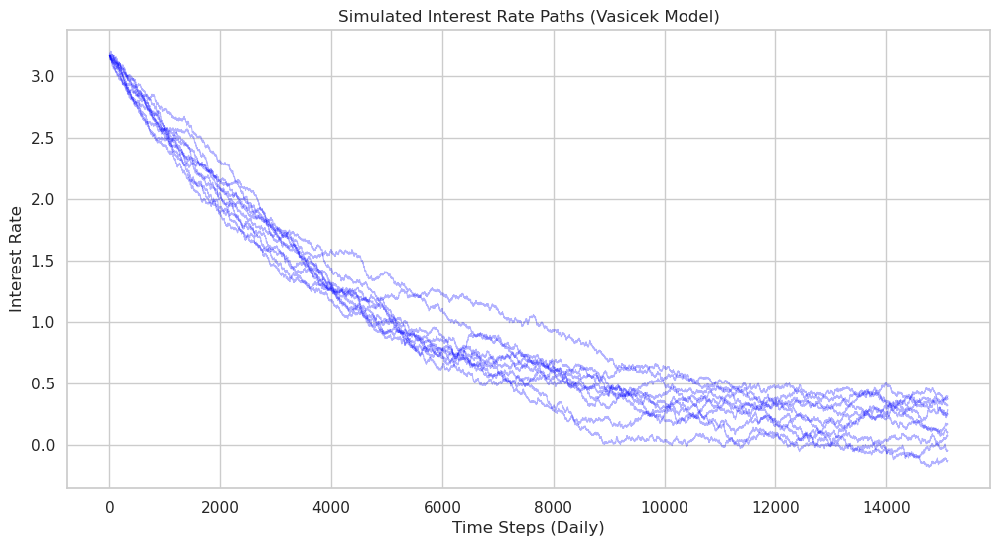

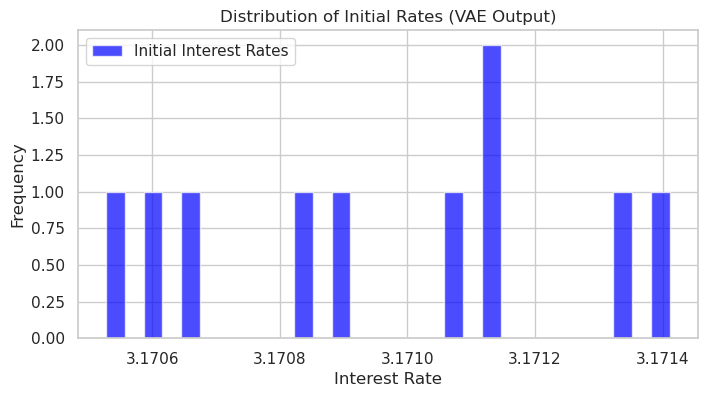

In [50]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming `z_mean` is obtained from the encoder of the trained VAE
# Replace this with the actual VAE encoder's output
z_mean = encoder.predict(interest_rates_normalized)[0]  # Ensure z_mean is from your trained VAE

# Limit the number of simulations for testing (e.g., 100 paths)
max_simulations = 10
z_mean = z_mean[:max_simulations]

# Rescale latent features to the original interest rate scale
initial_rates = scaler.inverse_transform(z_mean[:, 0].reshape(-1, 1)).flatten()

# Vasicek Model Parameters
kappa = 0.05  # Mean reversion rate
theta = 0.03  # Long-term mean
sigma = 0.05  # Volatility
time_horizon = 60  # Simulate for 60 days
time_step = 1 / 252  # Daily step

# Vasicek model function
def vasicek_model(r0, kappa, theta, sigma, T, dt):
    num_steps = int(T / dt)
    rates = np.zeros(num_steps)
    rates[0] = r0  # Set the initial rate
    for t in range(1, num_steps):
        dr = kappa * (theta - rates[t - 1]) * dt + sigma * np.sqrt(dt) * np.random.normal()
        rates[t] = rates[t - 1] + dr
    return rates

# Simulate Vasicek paths
all_rates = []

for r0 in initial_rates:
    rates = vasicek_model(r0, kappa, theta, sigma, time_horizon, time_step)
    all_rates.append(rates)

all_rates = np.array(all_rates)

# Plot simulated interest rate paths
plt.figure(figsize=(12, 6))
for path in all_rates:
    plt.plot(path, alpha=0.3, linewidth=0.8, color='blue')
plt.title('Simulated Interest Rate Paths (Vasicek Model)')
plt.xlabel('Time Steps (Daily)')
plt.ylabel('Interest Rate')
plt.savefig("Simulated Interest Rate Paths ut.png", dpi=300)

plt.show()

# Histogram of initial rates (from VAE output)
plt.figure(figsize=(8, 4))
plt.hist(initial_rates, bins=30, alpha=0.7, color='blue', label='Initial Interest Rates')
plt.title('Distribution of Initial Rates (VAE Output)')
plt.xlabel('Interest Rate')
plt.ylabel('Frequency')
plt.legend()
plt.savefig("Distribution of Initial Rates VAE Output.png", dpi=300)

plt.show()


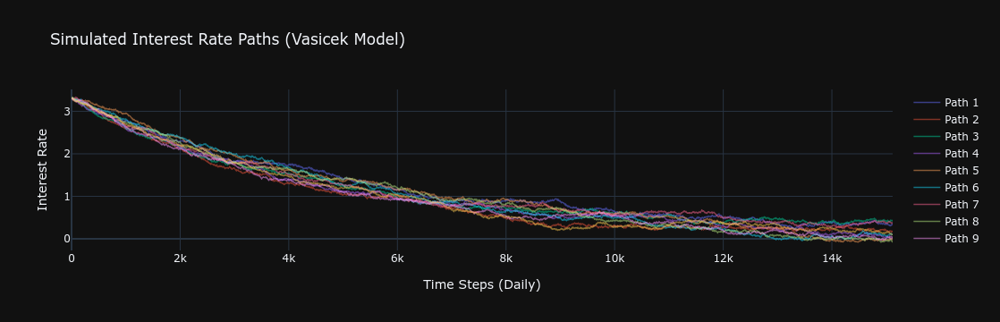

In [5]:
import plotly.graph_objects as go

fig = go.Figure()

for i, path in enumerate(all_rates):
    fig.add_trace(go.Scatter(
        y=path,
        mode='lines',
        name=f'Path {i+1}',
        line=dict(width=1.5),
        opacity=0.5
    ))

fig.update_layout(
    title="Simulated Interest Rate Paths (Vasicek Model)",
    xaxis_title="Time Steps (Daily)",
    yaxis_title="Interest Rate",
    template="plotly_dark"
)

fig.show()


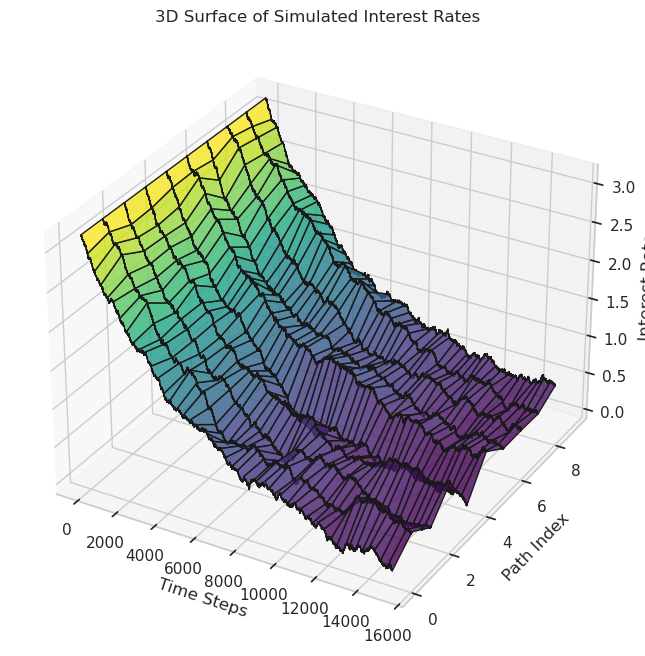

In [42]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

x = np.arange(all_rates.shape[1])  # Time steps
y = np.arange(all_rates.shape[0])  # Paths
X, Y = np.meshgrid(x, y)

ax.plot_surface(X, Y, all_rates, cmap='viridis', edgecolor='k', alpha=0.8)

ax.set_title("3D Surface of Simulated Interest Rates")
ax.set_xlabel("Time Steps")
ax.set_ylabel("Path Index")
ax.set_zlabel("Interest Rate")
plt.savefig("D Surface of Simulated Interest Rates.png", dpi=300)

plt.show()


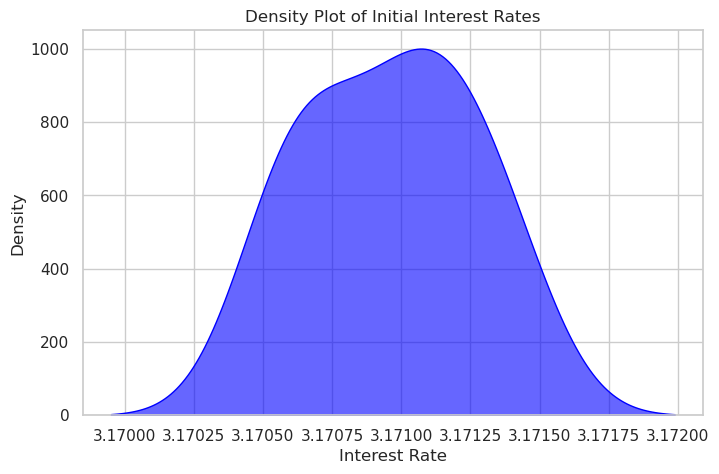

In [43]:
import seaborn as sns

sns.set(style="whitegrid")
plt.figure(figsize=(8, 5))
sns.kdeplot(initial_rates, fill=True, color='blue', alpha=0.6)
plt.title("Density Plot of Initial Interest Rates")
plt.xlabel("Interest Rate")
plt.ylabel("Density")
plt.savefig("Density Plot of Initial Interest Rates.png", dpi=300)

plt.show()


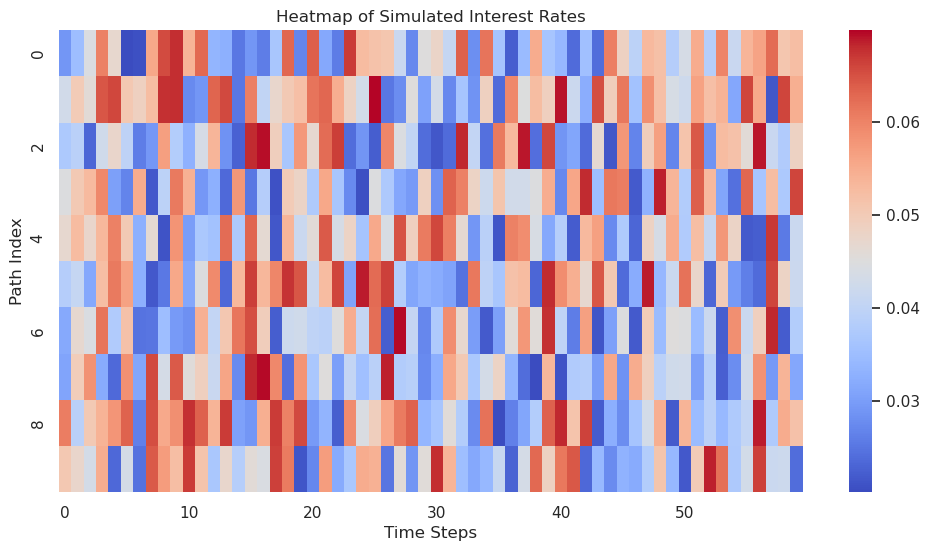

In [38]:
plt.figure(figsize=(12, 6))
sns.heatmap(all_rates, cmap='coolwarm', cbar=True, xticklabels=10, yticklabels=2)
plt.title("Heatmap of Simulated Interest Rates")
plt.xlabel("Time Steps")
plt.ylabel("Path Index")
plt.savefig("Heatmap of Simulated Interest Rates  c2.png", dpi=300)

plt.show()


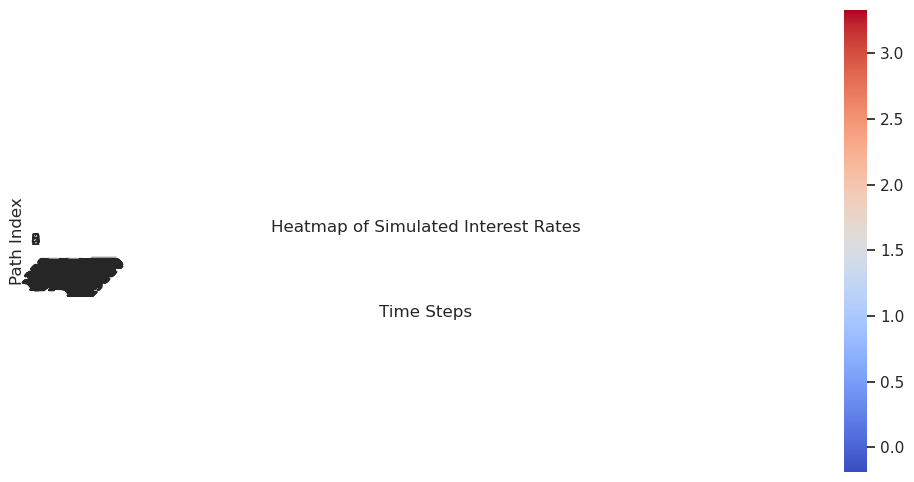

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(12, 6))

# Control xticks and yticks for less clutter
# For the x-axis, show every 10th time step
xticks = np.arange(0, all_rates.shape[1], step=10)
yticks = np.arange(0, all_rates.shape[0], step=2)  # For the y-axis, show every 2nd path

# Plot the heatmap with reduced tick labels
sns.heatmap(all_rates, 
            cmap='coolwarm', 
            cbar=True, 
            xticklabels=xticks,  # Use the reduced xticks
            yticklabels=yticks,  # Use the reduced yticks
            linewidths=0.5,      # Optional: make gridlines thinner
            annot=False,         # Disable annotations to avoid clutter
            square=True)         # Make the heatmap square-shaped

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Adding title and labels
plt.title("Heatmap of Simulated Interest Rates")
plt.xlabel("Time Steps")
plt.ylabel("Path Index")

# Save the plot with higher resolution
plt.savefig("Heatmap_of_Simulated_Interest_Rates.png", dpi=300, bbox_inches='tight')

plt.show()


189/189 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


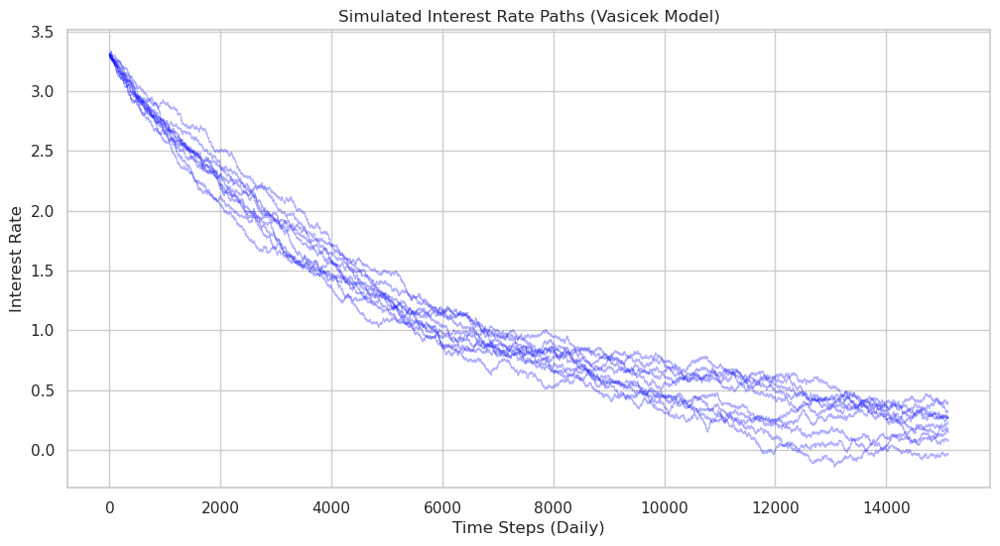

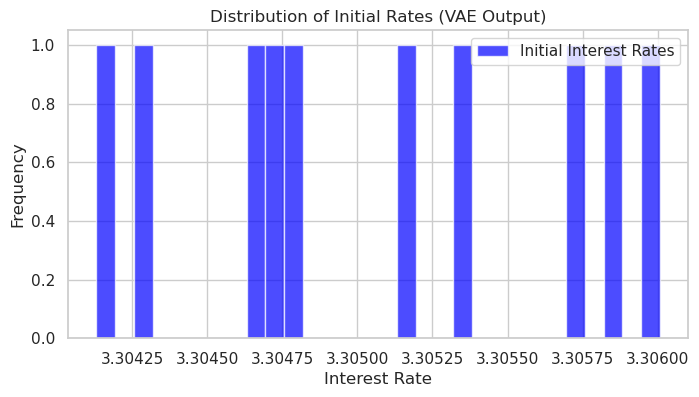

In [26]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming `z_mean` is obtained from the encoder of the trained VAE
# Replace this with the actual VAE encoder's output
z_mean = encoder.predict(interest_rates_normalized)[0]  # Ensure z_mean is from your trained VAE

# Limit the number of simulations for testing (e.g., 100 paths)
max_simulations = 10
z_mean = z_mean[:max_simulations]

# Rescale latent features to the original interest rate scale
initial_rates = scaler.inverse_transform(z_mean[:, 0].reshape(-1, 1)).flatten()

# Vasicek Model Parameters
kappa = 0.05  # Mean reversion rate
theta = 0.03  # Long-term mean
sigma = 0.05  # Volatility
time_horizon = 60  # Simulate for 60 days
time_step = 1 / 252  # Daily step

# Vasicek model function
def vasicek_model(r0, kappa, theta, sigma, T, dt):
    num_steps = int(T / dt)
    rates = np.zeros(num_steps)
    rates[0] = r0  # Set the initial rate
    for t in range(1, num_steps):
        dr = kappa * (theta - rates[t - 1]) * dt + sigma * np.sqrt(dt) * np.random.normal()
        rates[t] = rates[t - 1] + dr
    return rates

# Simulate Vasicek paths
all_rates = []

for r0 in initial_rates:
    rates = vasicek_model(r0, kappa, theta, sigma, time_horizon, time_step)
    all_rates.append(rates)

all_rates = np.array(all_rates)

# Plot simulated interest rate paths
plt.figure(figsize=(12, 6))
for path in all_rates:
    plt.plot(path, alpha=0.3, linewidth=0.8, color='blue')
plt.title('Simulated Interest Rate Paths (Vasicek Model)')
plt.xlabel('Time Steps (Daily)')
plt.ylabel('Interest Rate')
plt.show()

# Histogram of initial rates (from VAE output)
plt.figure(figsize=(8, 4))
plt.hist(initial_rates, bins=30, alpha=0.7, color='blue', label='Initial Interest Rates')
plt.title('Distribution of Initial Rates (VAE Output)')
plt.xlabel('Interest Rate')
plt.ylabel('Frequency')
plt.legend()
plt.savefig("Distribution of Initial Rates (VAE Output).png", dpi=300)

plt.show()


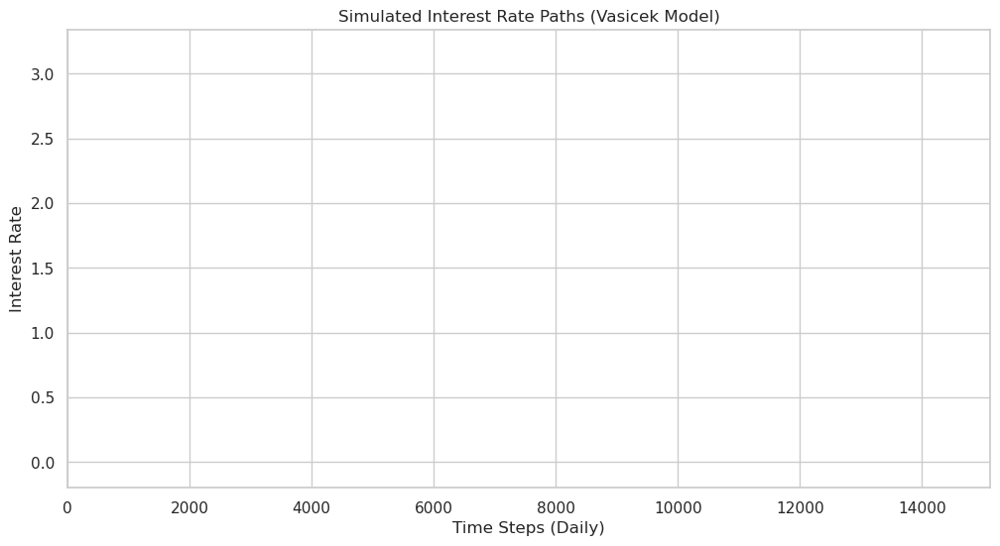

In [32]:
from matplotlib.animation import FuncAnimation

fig, ax = plt.subplots(figsize=(12, 6))

# Initialize lines with empty data
lines = [ax.plot([], [], alpha=0.5)[0] for _ in range(all_rates.shape[0])]

# Set axis limits
ax.set_xlim(0, all_rates.shape[1])
ax.set_ylim(np.min(all_rates) - 0.01, np.max(all_rates) + 0.01)  # Add a small margin

ax.set_title("Simulated Interest Rate Paths (Vasicek Model)")
ax.set_xlabel("Time Steps (Daily)")
ax.set_ylabel("Interest Rate")

# Function to update each frame
def update(frame):
    for i, (line, path) in enumerate(zip(lines, all_rates)):
        line.set_data(np.arange(frame), path[:frame])
    return lines

# Create the animation
ani = FuncAnimation(fig, update, frames=all_rates.shape[1], interval=50, blit=True)
plt.savefig("Latent Ssaasafserest Rates 1.png", dpi=300)

plt.show()


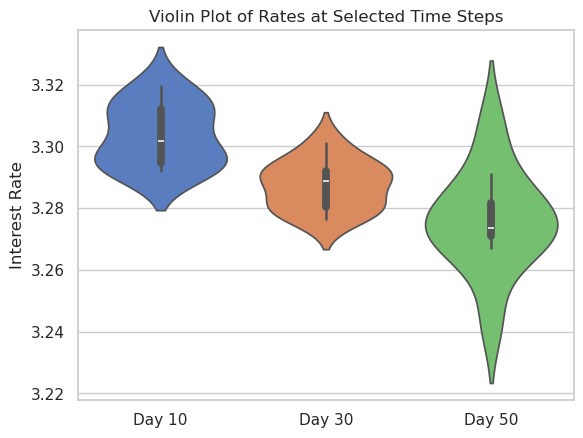

In [10]:
time_indices = [10, 30, 50]  # Choose time steps to analyze
data = {f"Day {idx}": all_rates[:, idx] for idx in time_indices}
import pandas as pd
df = pd.DataFrame(data)
sns.violinplot(data=df, palette="muted")
plt.title("Violin Plot of Rates at Selected Time Steps")
plt.ylabel("Interest Rate")
plt.savefig("Latent Space fdsfsdgsafa Interest Rates 1.png", dpi=300)

plt.show()


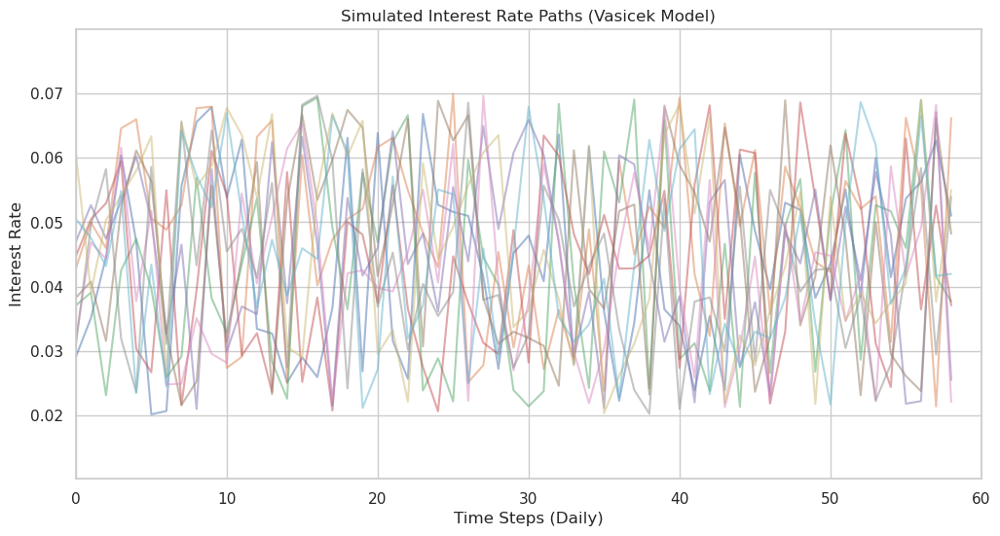

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Simulated data (replace with your actual `all_rates` array)
# Assuming `all_rates` is a 2D array of shape (num_paths, num_time_steps)
# For example, using random data for testing purposes
all_rates = np.random.rand(10, 60) * 0.05 + 0.02  # Random interest rates for 10 paths

# Create the figure and axes
fig, ax = plt.subplots(figsize=(12, 6))

# Initialize lines with empty data (one line for each path)
lines = [ax.plot([], [], alpha=0.5)[0] for _ in range(all_rates.shape[0])]

# Set axis limits
ax.set_xlim(0, all_rates.shape[1])
ax.set_ylim(np.min(all_rates) - 0.01, np.max(all_rates) + 0.01)  # Add a small margin

ax.set_title("Simulated Interest Rate Paths (Vasicek Model)")
ax.set_xlabel("Time Steps (Daily)")
ax.set_ylabel("Interest Rate")

# Function to update each frame (called at each frame of the animation)
def update(frame):
    for i, (line, path) in enumerate(zip(lines, all_rates)):
        line.set_data(np.arange(frame), path[:frame])
    return lines

# Create the animation
ani = FuncAnimation(fig, update, frames=all_rates.shape[1], interval=50, blit=True)

# Save the animation to a file (you can save as a .gif or .mp4)
ani.save("Simulated_Interest_Rate_Paths.mp4", writer='ffmpeg', fps=30)

# Show the animation in the plot
plt.show()


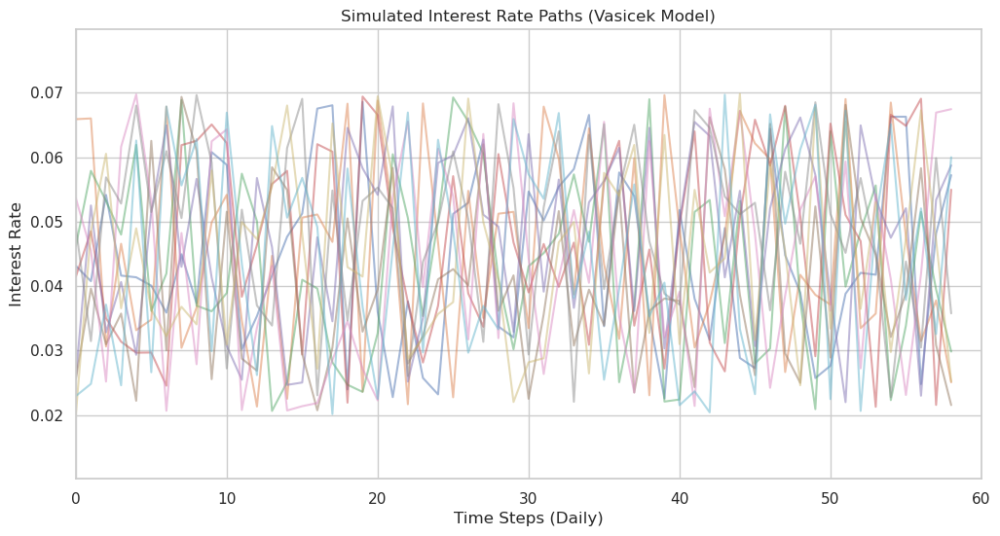

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Simulated data (replace with your actual `all_rates` array)
# Assuming `all_rates` is a 2D array of shape (num_paths, num_time_steps)
# For example, using random data for testing purposes
all_rates = np.random.rand(10, 60) * 0.05 + 0.02  # Random interest rates for 10 paths

# Create the figure and axes
fig, ax = plt.subplots(figsize=(12, 6))

# Initialize lines with empty data (one line for each path)
lines = [ax.plot([], [], alpha=0.5)[0] for _ in range(all_rates.shape[0])]

# Set axis limits
ax.set_xlim(0, all_rates.shape[1])
ax.set_ylim(np.min(all_rates) - 0.01, np.max(all_rates) + 0.01)  # Add a small margin

ax.set_title("Simulated Interest Rate Paths (Vasicek Model)")
ax.set_xlabel("Time Steps (Daily)")
ax.set_ylabel("Interest Rate")

# Function to update each frame (called at each frame of the animation)
def update(frame):
    for i, (line, path) in enumerate(zip(lines, all_rates)):
        line.set_data(np.arange(frame), path[:frame])
    return lines

# Create the animation
ani = FuncAnimation(fig, update, frames=all_rates.shape[1], interval=50, blit=True)

# Save the static image before the animation starts (static snapshot)
plt.savefig("Simulated_Interest_Rate_Paths_Static.png", dpi=300, bbox_inches='tight')

# Save the animation to a file (you can save as a .gif or .mp4)
ani.save("Simulated_Interest_Rate_Paths.mp4", writer='ffmpeg', fps=30)

# Show the animation in the plot
plt.show()
